In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
from PIL import Image, ImageDraw
from ast import literal_eval
import cv2, ast, math
import re
from tqdm.notebook import tqdm
import hashlib
tqdm.pandas()
import plotly.express as px
import plotly.graph_objects as go
import plotly.figure_factory as ff
from plotly.subplots import make_subplots
from glob import glob
from PIL import Image
import cv2
import matplotlib.cm as cm
from matplotlib import pyplot as plt # plotting
import matplotlib.patches as patches
%matplotlib inline

import seaborn as sns


from sklearn.preprocessing import OneHotEncoder
from sklearn.utils import shuffle
from sklearn import metrics
from tqdm import tqdm
# import useful tools


# import data visualization
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import seaborn as sns
sns.set()

from bokeh.plotting import figure
from bokeh.io import output_notebook, show, output_file
from bokeh.models import ColumnDataSource, HoverTool, Panel
from bokeh.models.widgets import Tabs

# import data augmentation
import albumentations as albu

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/opt/conda/lib/python3.7/site-packages/tqdm/std.py:666: FutureWarning: The Panel class is removed from pandas. Accessing it from the top-level namespace will also be removed in the next version
  from pandas import Panel


/kaggle/input/global-wheat-detection/sample_submission.csv
/kaggle/input/global-wheat-detection/train.csv
/kaggle/input/global-wheat-detection/test/796707dd7.jpg
/kaggle/input/global-wheat-detection/test/2fd875eaa.jpg
/kaggle/input/global-wheat-detection/test/cc3532ff6.jpg
/kaggle/input/global-wheat-detection/test/53f253011.jpg
/kaggle/input/global-wheat-detection/test/f5a1f0358.jpg
/kaggle/input/global-wheat-detection/test/51f1be19e.jpg
/kaggle/input/global-wheat-detection/test/aac893a91.jpg
/kaggle/input/global-wheat-detection/test/cb8d261a3.jpg
/kaggle/input/global-wheat-detection/test/51b3e36ab.jpg
/kaggle/input/global-wheat-detection/test/348a992bb.jpg
/kaggle/input/global-wheat-detection/train/944c60a15.jpg
/kaggle/input/global-wheat-detection/train/dd5dd0234.jpg
/kaggle/input/global-wheat-detection/train/72f8aaa4f.jpg
/kaggle/input/global-wheat-detection/train/69595016d.jpg
/kaggle/input/global-wheat-detection/train/28b8ba0aa.jpg
/kaggle/input/global-wheat-detection/train/2d6357

In [2]:
root_path = "../input/global-wheat-detection/"
train_folder = "../input/global-wheat-detection/train/"
test_folder = "../input/global-wheat-detection/test/"
train_csv_path = "../input/global-wheat-detection/train.csv"
sample_submission = "../input/global-wheat-detection/sample_submission.csv"

# Glob the directories and get the lists of train and test images
train_fns = glob(train_folder + '*')
test_fns = glob(test_folder + '*')

In [3]:
df = pd.read_csv(train_csv_path)
df.head()

,image_id,width,height,bbox,source
0,b6ab77fd7,1024,1024,"[834.0, 222.0, 56.0, 36.0]",usask_1
1,b6ab77fd7,1024,1024,"[226.0, 548.0, 130.0, 58.0]",usask_1
2,b6ab77fd7,1024,1024,"[377.0, 504.0, 74.0, 160.0]",usask_1
3,b6ab77fd7,1024,1024,"[834.0, 95.0, 109.0, 107.0]",usask_1
4,b6ab77fd7,1024,1024,"[26.0, 144.0, 124.0, 117.0]",usask_1


In [4]:
df.shape[0]

147793

In [5]:
df['image_id'].nunique()

3373

In [6]:
df['height'].value_counts(), df['width'].value_counts()

(1024    147793
 Name: height, dtype: int64,
 1024    147793
 Name: width, dtype: int64)

In [7]:
df['width'].unique() == df['height'].unique() == [1024]

array([ True])

In [8]:
df[['x_min','y_min', 'width', 'height']] = pd.DataFrame([ast.literal_eval(x) for x in df.bbox.tolist()], index= df.index)
df = df[['image_id', 'bbox', 'source', 'x_min', 'y_min', 'width', 'height']]
df

,image_id,bbox,source,x_min,y_min,width,height
0,b6ab77fd7,"[834.0, 222.0, 56.0, 36.0]",usask_1,834.0,222.0,56.0,36.0
1,b6ab77fd7,"[226.0, 548.0, 130.0, 58.0]",usask_1,226.0,548.0,130.0,58.0
2,b6ab77fd7,"[377.0, 504.0, 74.0, 160.0]",usask_1,377.0,504.0,74.0,160.0
3,b6ab77fd7,"[834.0, 95.0, 109.0, 107.0]",usask_1,834.0,95.0,109.0,107.0
4,b6ab77fd7,"[26.0, 144.0, 124.0, 117.0]",usask_1,26.0,144.0,124.0,117.0
...,...,...,...,...,...,...,...
147788,5e0747034,"[64.0, 619.0, 84.0, 95.0]",arvalis_2,64.0,619.0,84.0,95.0
147789,5e0747034,"[292.0, 549.0, 107.0, 82.0]",arvalis_2,292.0,549.0,107.0,82.0
147790,5e0747034,"[134.0, 228.0, 141.0, 71.0]",arvalis_2,134.0,228.0,141.0,71.0
147791,5e0747034,"[430.0, 13.0, 184.0, 79.0]",arvalis_2,430.0,13.0,184.0,79.0


In [9]:
df['x'] = -1
df['y'] = -1
df['w'] = -1
df['h'] = -1

def expand_bbox(x):
    r = np.array(re.findall("([0-9]+[.]?[0-9]*)", x))
    if len(r) == 0:
        r = [-1, -1, -1, -1]
    return r

df[['x', 'y', 'w', 'h']] = np.stack(df['bbox'].apply(lambda x: expand_bbox(x)))
df.drop(columns=['bbox'], inplace=True)
df['x'] = df['x'].astype(np.float)
df['y'] = df['y'].astype(np.float)
df['w'] = df['w'].astype(np.float)
df['h'] = df['h'].astype(np.float)

In [10]:
df

,image_id,source,x_min,y_min,width,height,x,y,w,h
0,b6ab77fd7,usask_1,834.0,222.0,56.0,36.0,834.0,222.0,56.0,36.0
1,b6ab77fd7,usask_1,226.0,548.0,130.0,58.0,226.0,548.0,130.0,58.0
2,b6ab77fd7,usask_1,377.0,504.0,74.0,160.0,377.0,504.0,74.0,160.0
3,b6ab77fd7,usask_1,834.0,95.0,109.0,107.0,834.0,95.0,109.0,107.0
4,b6ab77fd7,usask_1,26.0,144.0,124.0,117.0,26.0,144.0,124.0,117.0
...,...,...,...,...,...,...,...,...,...,...
147788,5e0747034,arvalis_2,64.0,619.0,84.0,95.0,64.0,619.0,84.0,95.0
147789,5e0747034,arvalis_2,292.0,549.0,107.0,82.0,292.0,549.0,107.0,82.0
147790,5e0747034,arvalis_2,134.0,228.0,141.0,71.0,134.0,228.0,141.0,71.0
147791,5e0747034,arvalis_2,430.0,13.0,184.0,79.0,430.0,13.0,184.0,79.0


In [11]:
df.groupby(by='image_id')['source'].count().agg(['min', 'max', 'mean'])

min       1.000000
max     116.000000
mean     43.816484
Name: source, dtype: float64

In [12]:
source = df['source'].value_counts()
source

ethz_1       51489
arvalis_1    45716
rres_1       20236
arvalis_3    16665
usask_1       5807
arvalis_2     4179
inrae_1       3701
Name: source, dtype: int64

In [13]:
# Load the dataframe with the bounding boxes
train = pd.read_csv(train_csv_path)

# Create a dataframe with all train images
all_train_images = pd.DataFrame([fns.split('/')[-1][:-4] for fns in train_fns]) #Fetching name/Id of the image, ex:4b95f5e5a
all_train_images.columns=['image_id']

# Merge all train images with the bounding boxes dataframe
all_train_images = all_train_images.merge(train, on='image_id', how='left')

# replace nan values with zeros
all_train_images['bbox'] = all_train_images.bbox.fillna('[0,0,0,0]')

# split bbox column
bbox_items = all_train_images.bbox.str.split(',', expand=True)
all_train_images['bbox_xmin'] = bbox_items[0].str.strip('[ ').astype(float)
all_train_images['bbox_ymin'] = bbox_items[1].str.strip(' ').astype(float)
all_train_images['bbox_width'] = bbox_items[2].str.strip(' ').astype(float)
all_train_images['bbox_height'] = bbox_items[3].str.strip(' ]').astype(float)

In [14]:
all_train_images.head()

,image_id,width,height,bbox,source,bbox_xmin,bbox_ymin,bbox_width,bbox_height
0,944c60a15,1024.0,1024.0,"[336, 54, 69, 49]",arvalis_1,336.0,54.0,69.0,49.0
1,944c60a15,1024.0,1024.0,"[218, 0, 79, 45]",arvalis_1,218.0,0.0,79.0,45.0
2,944c60a15,1024.0,1024.0,"[2, 0, 56, 65]",arvalis_1,2.0,0.0,56.0,65.0
3,944c60a15,1024.0,1024.0,"[588, 256, 71, 96]",arvalis_1,588.0,256.0,71.0,96.0
4,944c60a15,1024.0,1024.0,"[257, 251, 61, 80]",arvalis_1,257.0,251.0,61.0,80.0


In [15]:
print('{} images without wheat heads.'.format(len(all_train_images) - len(train)))

49 images without wheat heads.


In [16]:
def get_all_bboxes(df, image_id):
    image_bboxes = df[df.image_id == image_id]
    
    bboxes = []
    for _,row in image_bboxes.iterrows():
        bboxes.append((row.bbox_xmin, row.bbox_ymin, row.bbox_width, row.bbox_height))
        
    return bboxes

def plot_image_examples(df, rows=3, cols=3, title='Image examples'):
    fig, axs = plt.subplots(rows, cols, figsize=(10,10))
    for row in range(rows):
        for col in range(cols):
            idx = np.random.randint(len(df), size=1)[0]
            img_id = df.iloc[idx].image_id
            
            img = Image.open(train_folder + img_id + '.jpg')
            axs[row, col].imshow(img)
            
            bboxes = get_all_bboxes(df, img_id)
            
            for bbox in bboxes:
                rect = patches.Rectangle((bbox[0],bbox[1]),bbox[2],bbox[3],linewidth=1,edgecolor='r',facecolor='none')
                axs[row, col].add_patch(rect)
            
            axs[row, col].axis('off')
            
    plt.suptitle(title)

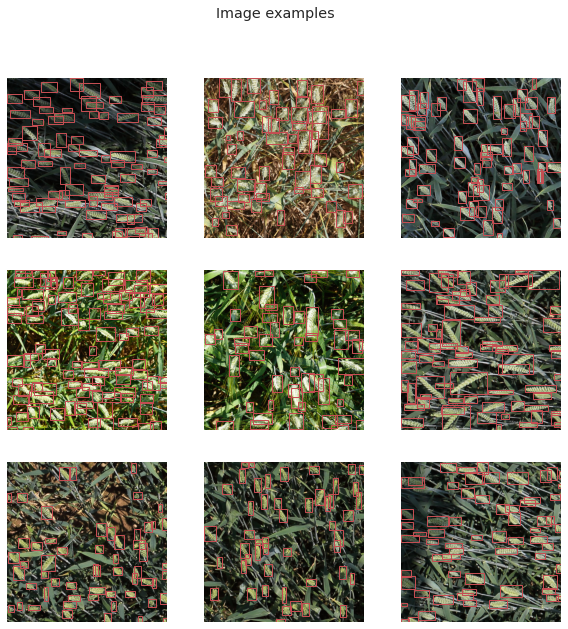

In [17]:
plot_image_examples(all_train_images)

In [18]:
# compute the number of bounding boxes per train image
all_train_images['count'] = all_train_images.apply(lambda row: 1 if np.isfinite(row.width) else 0, axis=1)
print(all_train_images.head())
train_images_count = all_train_images.groupby('image_id').sum().reset_index()
print(train_images_count.head())

    image_id   width  height                bbox     source  bbox_xmin  \
0  944c60a15  1024.0  1024.0   [336, 54, 69, 49]  arvalis_1      336.0   
1  944c60a15  1024.0  1024.0    [218, 0, 79, 45]  arvalis_1      218.0   
2  944c60a15  1024.0  1024.0      [2, 0, 56, 65]  arvalis_1        2.0   
3  944c60a15  1024.0  1024.0  [588, 256, 71, 96]  arvalis_1      588.0   
4  944c60a15  1024.0  1024.0  [257, 251, 61, 80]  arvalis_1      257.0   

   bbox_ymin  bbox_width  bbox_height  count  
0       54.0        69.0         49.0      1  
1        0.0        79.0         45.0      1  
2        0.0        56.0         65.0      1  
3      256.0        71.0         96.0      1  
4      251.0        61.0         80.0      1  
    image_id    width   height  bbox_xmin  bbox_ymin  bbox_width  bbox_height  \
0  00333207f  56320.0  56320.0    26091.0    23051.0      4792.0       3846.0   
1  005b0d8bb  20480.0  20480.0     8635.0     9267.0      2739.0       2410.0   
2  006a994f7  25600.0  25600.0

In [19]:
fig = go.Figure(data=[
    go.Pie(labels=source.index, values=source.values)
])

fig.update_layout(title='Source distribution')
fig.show()

Descriptive statistics of Image data

In [20]:
print(f'Total no. of images                        : {df.shape[0]}')
print(f'Total no. of unique images                 : {df["image_id"].nunique()}')
print(f'Checking Dimentions - heights and widths   : {df["width"].unique()}, {df["height"].unique()}')
print(f'Maximum number of wheat heads in the Image : {max(df["image_id"].value_counts())}')
print(f'Average wheat heads in the Image           : {len(df)/df["image_id"].nunique()}')

Total no. of images                        : 147793
Total no. of unique images                 : 3373
Checking Dimentions - heights and widths   : [ 56.  130.   74.  109.  124.  119.   82.  122.   68.  126.   46.  117.
 110.   58.  121.  118.  113.  127.   87.   43.   86.   57.  116.   76.
  70.   73.  106.   80.   92.   51.  140.  104.  115.  215.  131.   23.
 221.   72.   36.   65.  108.  156.   49.   90.  172.  194.  148.  179.
  53.  178.   88.  151.   81.  212.   50.   79.   41.  120.  175.   44.
 153.   39.   75.   69.   60.   31.   97.  125.   63.  100.   94.   78.
 103.   54.  137.   96.   59.   61.  134.   99.   28.   83.   93.   85.
  84.  368.   77.  185.   98.  174.   95.   66.   27.   47.  147.  102.
  64.  143.   91.  132.  163.   29.   24.   62.  191.  200.  241.  114.
 242.   52.  224.   71.  231.  150.  159.   89.  105.  139.   48.   38.
 158.  101.  184.  149.  198.  204.  141.  161.  123.  111.   42.  254.
 197.  189.  253.  129.  188.  128.  112.  107.  216.  170.  

Distribution of images by wheat heads

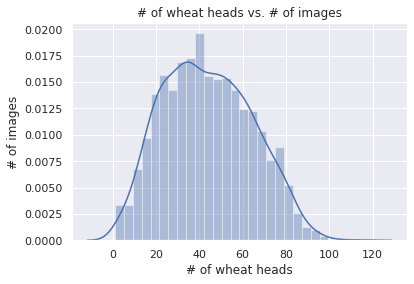

In [21]:
sns.distplot(df['image_id'].value_counts(), kde=True)
plt.xlabel('# of wheat heads')
plt.ylabel('# of images')
plt.title('# of wheat heads vs. # of images')
plt.show()

Bounding Boxes per Image

In [22]:
box_count = df["image_id"].value_counts()

hist_data = [box_count.values]
group_labels = ['Count'] # name of the dataset

fig = ff.create_distplot(hist_data, group_labels, bin_size=2)
fig.update_layout(title_text="Number of bounding boxes per image", template="simple_white", title_x=0.5)
fig.show()

Visualize few samples of current training dataset

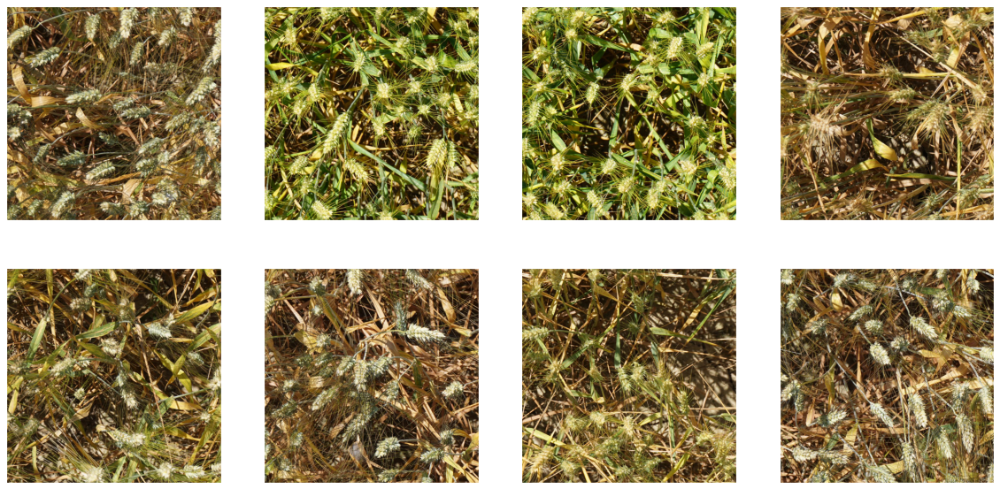

In [23]:
# Visualize few samples of current training dataset
fig, ax = plt.subplots(nrows=2, ncols=4, figsize=(20, 10))
count=1000
for row in ax:
    for col in row:
        img = plt.imread(f'{os.path.join(root_path, "train", df["image_id"].unique()[count])}.jpg')
        col.grid(False)
        col.set_xticks([])
        col.set_yticks([])
        col.imshow(img)
        count += 1
plt.show()

Visualize few samples of current training dataset with boxes

In [24]:
def get_bbox(image_id, df, col, color='white'):
    bboxes = df[df['image_id'] == image_id]
    
    for i in range(len(bboxes)):
        # Create a Rectangle patch
        rect = patches.Rectangle(
            (bboxes['x_min'].iloc[i], bboxes['y_min'].iloc[i]),
            bboxes['width'].iloc[i], 
            bboxes['height'].iloc[i], 
            linewidth=2, 
            edgecolor=color, 
            facecolor='none')

        # Add the patch to the Axes
        col.add_patch(rect)

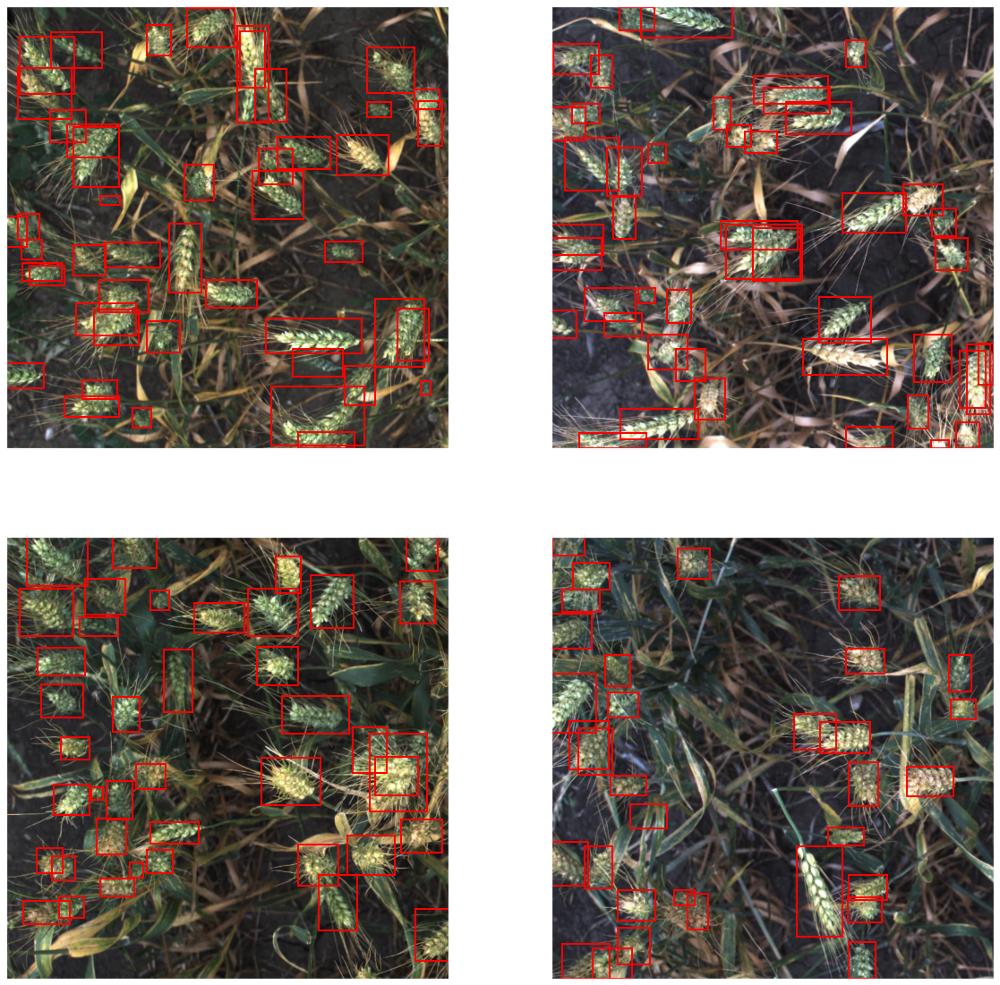

In [25]:
# Visualize few samples of current training dataset
fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(20, 20))
count=0
for row in ax:
    for col in row:
        img_id = df["image_id"].unique()[count]
        img = plt.imread(f'{os.path.join(root_path, "train", img_id)}.jpg')
        col.grid(False)
        col.set_xticks([])
        col.set_yticks([])
        get_bbox(img_id, df, col, color='red')
        col.imshow(img)
        count += 1
plt.show()

### Images with Maximum and Minimum Wheat heads

Maximum wheat heads : 116


[]

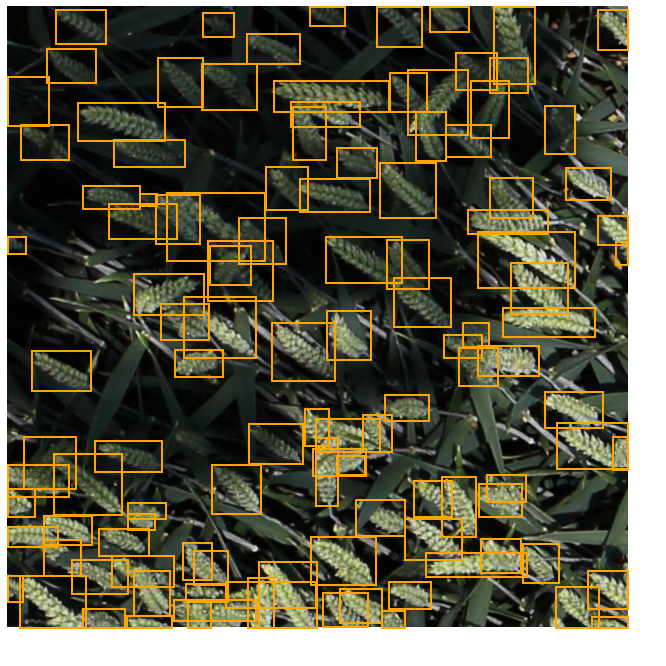

In [26]:
image_id = (df['image_id'].value_counts() == max(df["image_id"].value_counts())).index[0]
print('Maximum wheat heads :',max(df["image_id"].value_counts()))
img = plt.imread(f'{os.path.join(root_path, "train", image_id)}.jpg')
fig, ax = plt.subplots(1, figsize=(12, 12))
ax.grid(False)
ax.set_xticks([])
ax.set_yticks([])
ax.axis('off')
get_bbox(image_id, df, ax, color='orange')
ax.imshow(img)
plt.plot()

In [27]:
source = df['source'].value_counts()
print(df['source'].value_counts())
wheat_src_df = df.groupby(['source']).agg({'image_id':'count'}).reset_index()
wheat_src_df.rename(columns={'image_id':'count'},inplace=True)

ethz_1       51489
arvalis_1    45716
rres_1       20236
arvalis_3    16665
usask_1       5807
arvalis_2     4179
inrae_1       3701
Name: source, dtype: int64


In [28]:
wheat_src_df

,source,count
0,arvalis_1,45716
1,arvalis_2,4179
2,arvalis_3,16665
3,ethz_1,51489
4,inrae_1,3701
5,rres_1,20236
6,usask_1,5807


Wheat - Source Share

In [29]:
fig = go.Figure(data=[
    go.Pie(labels=source.index, values=source.values)
])

fig.update_layout(title='Source distribution')
fig.show()

In [30]:
fig = go.Figure(go.Bar(x=df['source'].value_counts().index, 
                       y=df['source'].value_counts(),
                       marker_color='lightsalmon'))
fig.update_layout(title_text="Bar chart of sources", title_x=0.5)
fig.show()

In [31]:
bbox_count = df.groupby("source")["image_id"].apply(lambda X: X.value_counts().mean()).reset_index().rename(columns={"image_id": "bbox_count"})

fig = go.Figure(go.Bar(x=bbox_count.source, 
                       y=bbox_count.bbox_count,
                       name='Bbox counts', marker_color='indianred'))
fig.update_layout(title_text="Bar chart of Bbox counts in image", template="simple_white", title_x=0.5)
fig.show()

In [32]:
# compute the number of bounding boxes per train image
all_train_images['count'] = all_train_images.apply(lambda row: 1 if np.isfinite(row.width) else 0, axis=1)
print(all_train_images.head())
train_images_count = all_train_images.groupby('image_id').sum().reset_index()
print(train_images_count.head())

    image_id   width  height                bbox     source  bbox_xmin  \
0  944c60a15  1024.0  1024.0   [336, 54, 69, 49]  arvalis_1      336.0   
1  944c60a15  1024.0  1024.0    [218, 0, 79, 45]  arvalis_1      218.0   
2  944c60a15  1024.0  1024.0      [2, 0, 56, 65]  arvalis_1        2.0   
3  944c60a15  1024.0  1024.0  [588, 256, 71, 96]  arvalis_1      588.0   
4  944c60a15  1024.0  1024.0  [257, 251, 61, 80]  arvalis_1      257.0   

   bbox_ymin  bbox_width  bbox_height  count  
0       54.0        69.0         49.0      1  
1        0.0        79.0         45.0      1  
2        0.0        56.0         65.0      1  
3      256.0        71.0         96.0      1  
4      251.0        61.0         80.0      1  
    image_id    width   height  bbox_xmin  bbox_ymin  bbox_width  bbox_height  \
0  00333207f  56320.0  56320.0    26091.0    23051.0      4792.0       3846.0   
1  005b0d8bb  20480.0  20480.0     8635.0     9267.0      2739.0       2410.0   
2  006a994f7  25600.0  25600.0

In [33]:
# See this article on how to plot bar charts with Bokeh:
# https://towardsdatascience.com/interactive-histograms-with-bokeh-202b522265f3
def hist_hover(dataframe, column, colors=["#94c8d8", "#ea5e51"], bins=30, title=''):
    hist, edges = np.histogram(dataframe[column], bins = bins)
    
    hist_df = pd.DataFrame({column: hist,
                             "left": edges[:-1],
                             "right": edges[1:]})
    hist_df["interval"] = ["%d to %d" % (left, right) for left, 
                           right in zip(hist_df["left"], hist_df["right"])]

    src = ColumnDataSource(hist_df)
    plot = figure(plot_height = 400, plot_width = 600,
          title = title,
          x_axis_label = column,
          y_axis_label = "Count")    
    plot.quad(bottom = 0, top = column,left = "left", 
        right = "right", source = src, fill_color = colors[0], 
        line_color = "#35838d", fill_alpha = 0.7,
        hover_fill_alpha = 0.7, hover_fill_color = colors[1])
        
    hover = HoverTool(tooltips = [('Interval', '@interval'),
                              ('Count', str("@" + column))])
    plot.add_tools(hover)
    
    output_notebook()
    show(plot)

In [34]:
hist_hover(train_images_count, 'count', title='Number of wheat spikes per image')

Loading BokehJS ...

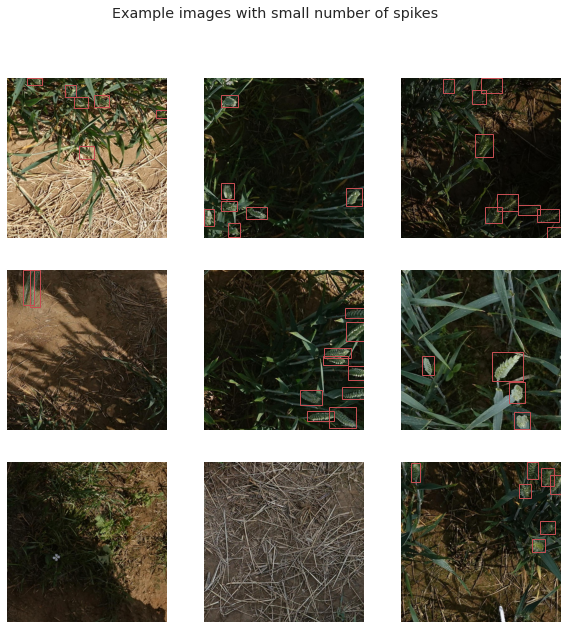

In [35]:
less_spikes_ids = train_images_count[train_images_count['count'] < 10].image_id
plot_image_examples(all_train_images[all_train_images.image_id.isin(less_spikes_ids)], title='Example images with small number of spikes')

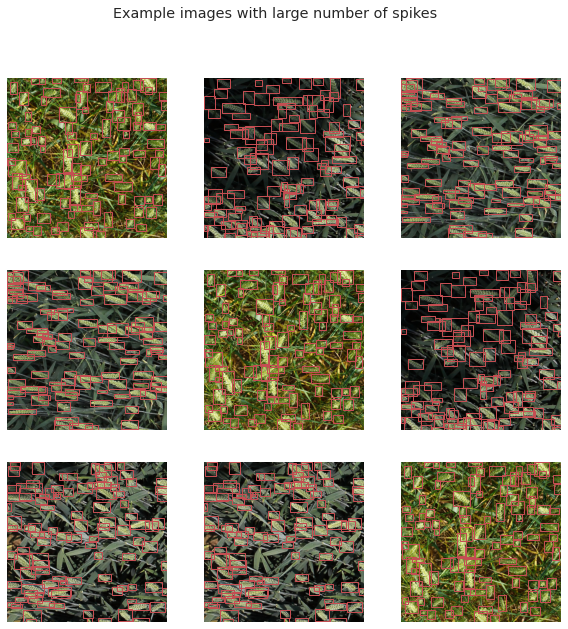

In [36]:
many_spikes_ids = train_images_count[train_images_count['count'] > 100].image_id
plot_image_examples(all_train_images[all_train_images.image_id.isin(many_spikes_ids)], title='Example images with large number of spikes')

In [37]:
# compute bounding box areas
all_train_images['bbox_area'] = all_train_images['bbox_width'] * all_train_images['bbox_height']

In [38]:
# plot a histogram of bounding box areas
hist_hover(all_train_images, 'bbox_area', title='Area of a single bounding box')

Loading BokehJS ...

In [39]:
all_train_images.bbox_area.max()

529788.0

### Large bbox areas

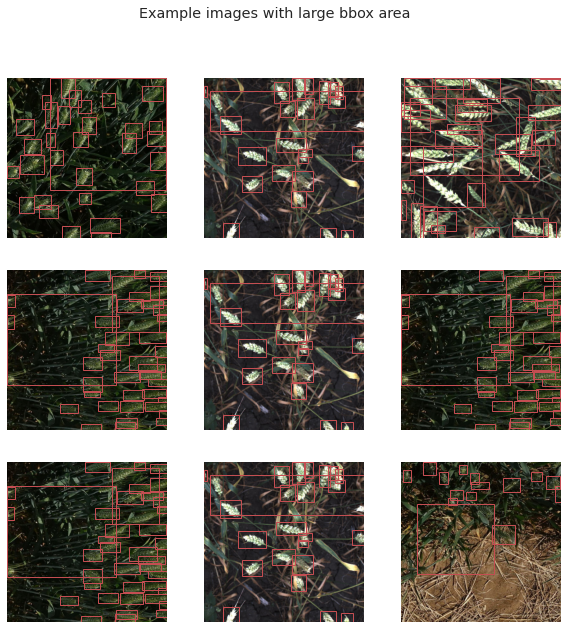

In [40]:
large_boxes_ids = all_train_images[all_train_images['bbox_area'] > 200000].image_id
plot_image_examples(all_train_images[all_train_images.image_id.isin(large_boxes_ids)], title='Example images with large bbox area')

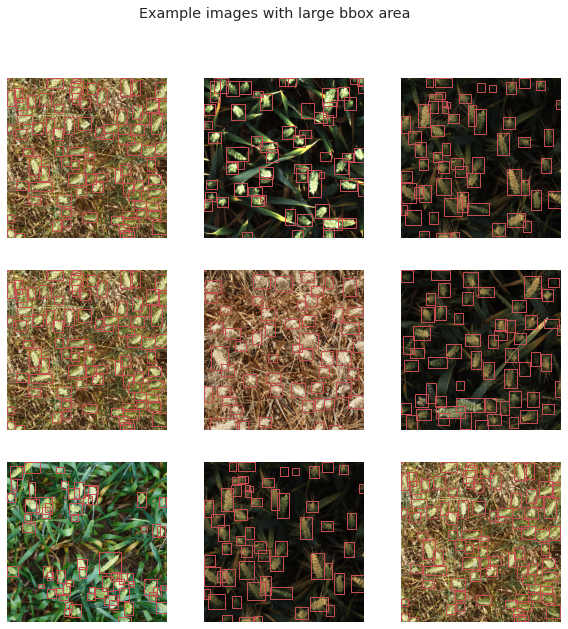

In [41]:
small_boxes_ids = all_train_images[(all_train_images['bbox_area'] < 50) & (all_train_images['bbox_area'] > 0)].image_id
plot_image_examples(all_train_images[all_train_images.image_id.isin(small_boxes_ids)], title='Example images with large bbox area')

### Small bbox areas

In [42]:
min_area = all_train_images[all_train_images['bbox_area'] > 0].bbox_area.min()
print('The smallest bounding box area is {}'.format(min_area))

The smallest bounding box area is 2.0


In [43]:
# compute the total bounding boxes area per image
area_per_image = all_train_images.groupby(by='image_id').sum().reset_index()

### image % area covered by bounding boxes

In [44]:
# compute the percentage of the image area covered by bounding boxes
area_per_image_percentage = area_per_image.copy()
area_per_image_percentage['bbox_area'] = area_per_image_percentage['bbox_area'] / (1024*1024) * 100
hist_hover(area_per_image_percentage, 'bbox_area', title='Percentage of image area covered by bounding boxes')

Loading BokehJS ...

### Small area covered by bounding boxes

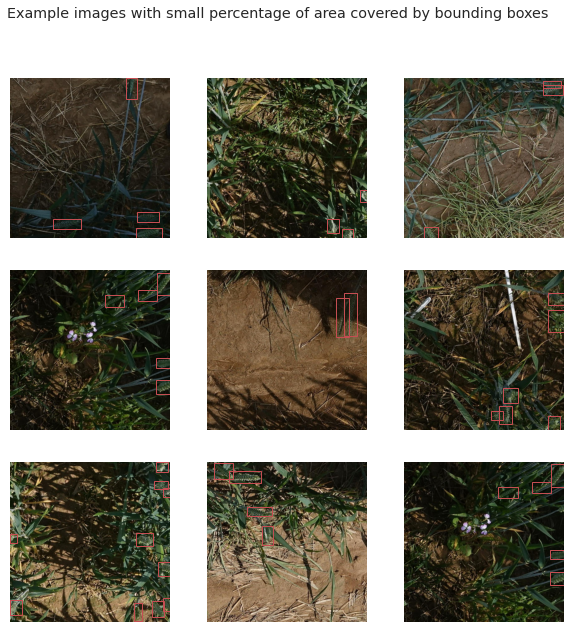

In [45]:
small_area_perc_ids = area_per_image_percentage[area_per_image_percentage['bbox_area'] < 7].image_id
plot_image_examples(all_train_images[all_train_images.image_id.isin(small_area_perc_ids)], title='Example images with small percentage of area covered by bounding boxes')

### Large area covered by bounding boxes

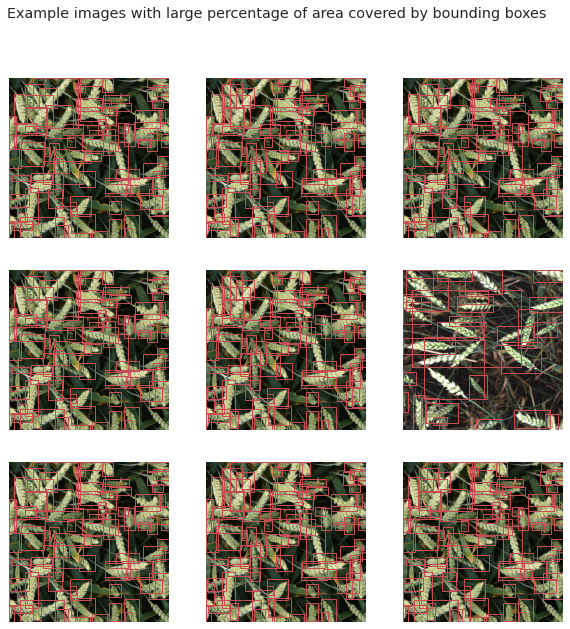

In [46]:
large_area_perc_ids = area_per_image_percentage[area_per_image_percentage['bbox_area'] > 95].image_id
plot_image_examples(all_train_images[all_train_images.image_id.isin(large_area_perc_ids)], title='Example images with large percentage of area covered by bounding boxes')

In [47]:
def get_image_brightness(image):
    # convert to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # get average brightness
    return np.array(gray).mean()

def add_brightness(df):
    brightness = []
    for _, row in df.iterrows():
        img_id = row.image_id  
        image = cv2.imread(train_folder + img_id + '.jpg')
        brightness.append(get_image_brightness(image))
        
    brightness_df = pd.DataFrame(brightness)
    brightness_df.columns = ['brightness']
    df = pd.concat([df, brightness_df], ignore_index=True, axis=1)
    df.columns = ['image_id', 'brightness']
    
    return df

In [48]:
images_df = pd.DataFrame(all_train_images.image_id.unique())
images_df.columns = ['image_id']

In [49]:
# add brightness to the dataframe
images_df = pd.DataFrame(all_train_images.image_id.unique())
images_df.columns = ['image_id']
brightness_df = add_brightness(images_df)

In [50]:
all_train_images = all_train_images.merge(brightness_df, on='image_id')
hist_hover(all_train_images, 'brightness', title='Images brightness distribution')

Loading BokehJS ...

### Plot the darkest images:

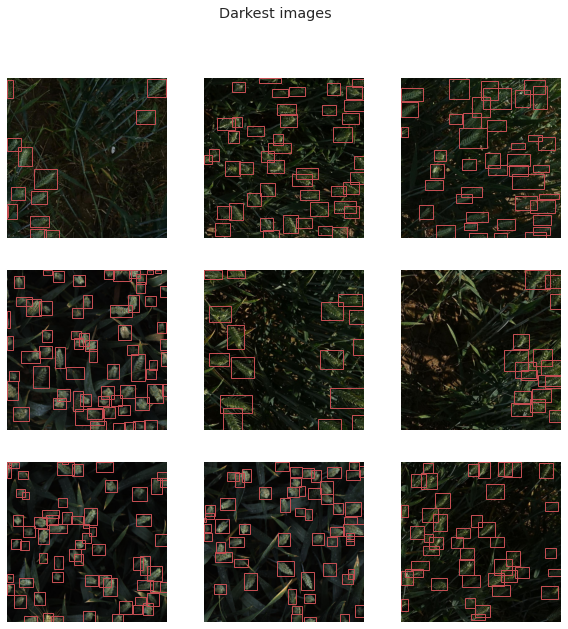

In [51]:
dark_ids = all_train_images[all_train_images['brightness'] < 30].image_id
plot_image_examples(all_train_images[all_train_images.image_id.isin(dark_ids)], title='Darkest images')

### Plot the brightest images:

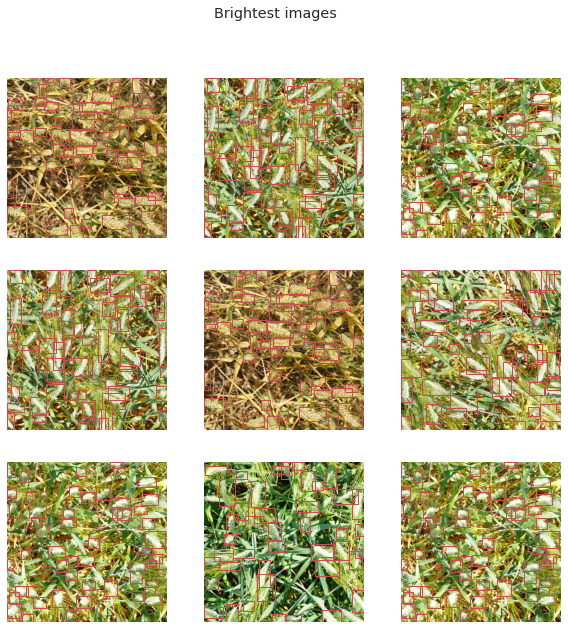

In [52]:
bright_ids = all_train_images[all_train_images['brightness'] > 130].image_id
plot_image_examples(all_train_images[all_train_images.image_id.isin(bright_ids)], title='Brightest images')

In [53]:
def get_percentage_of_green_pixels(image):
    # convert to HSV
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    
    # get the green mask
    hsv_lower = (40, 40, 40) 
    hsv_higher = (70, 255, 255)
    green_mask = cv2.inRange(hsv, hsv_lower, hsv_higher)
    
    return float(np.sum(green_mask)) / 255 / (1024 * 1024)

def get_percentage_of_yellow_pixels(image):
    # convert to HSV
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    
    # get the green mask
    hsv_lower = (25, 40, 40) 
    hsv_higher = (35, 255, 255)
    yellow_mask = cv2.inRange(hsv, hsv_lower, hsv_higher)
    
    return float(np.sum(yellow_mask)) / 255 / (1024 * 1024)

def add_green_pixels_percentage(df):
    green = []
    for _, row in df.iterrows():
        img_id = row.image_id  
        image = cv2.imread(train_folder + img_id + '.jpg')
        green.append(get_percentage_of_green_pixels(image))
        
    green_df = pd.DataFrame(green)
    green_df.columns = ['green_pixels']
    df = pd.concat([df, green_df], ignore_index=True, axis=1)
    df.columns = ['image_id', 'green_pixels']
    
    return df

def add_yellow_pixels_percentage(df):
    yellow = []
    for _, row in df.iterrows():
        img_id = row.image_id  
        image = cv2.imread(train_folder + img_id + '.jpg')
        yellow.append(get_percentage_of_yellow_pixels(image))
        
    yellow_df = pd.DataFrame(yellow)
    yellow_df.columns = ['yellow_pixels']
    df = pd.concat([df, yellow_df], ignore_index=True, axis=1)
    df.columns = ['image_id', 'yellow_pixels']
    
    return df

In [54]:
# add a column with the percentage of green pixels
green_pixels_df = add_green_pixels_percentage(images_df)
all_train_images = all_train_images.merge(green_pixels_df, on='image_id')

In [55]:
hist_hover(all_train_images, 'green_pixels', title='Percentage of green pixels distribution', colors=['#c3ea84', '#3e7a17'])

Loading BokehJS ...

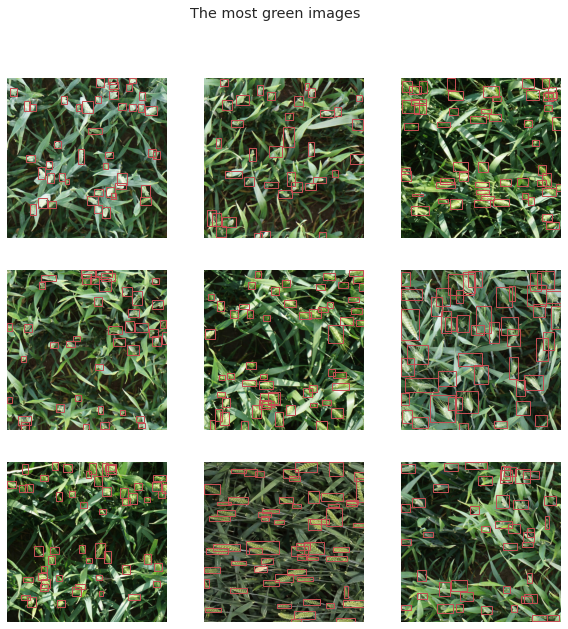

In [56]:
green_ids = all_train_images[all_train_images['green_pixels'] > 0.55].image_id
plot_image_examples(all_train_images[all_train_images.image_id.isin(green_ids)], title='The most green images')

In [57]:
# add a column with the percentage of yellow pixels
yellow_pixels_df = add_yellow_pixels_percentage(images_df)
all_train_images = all_train_images.merge(yellow_pixels_df, on='image_id')
hist_hover(all_train_images, 'yellow_pixels', title='Percentage of yellow pixels distribution', colors=['#fffedb', '#fffeab'])

Loading BokehJS ...

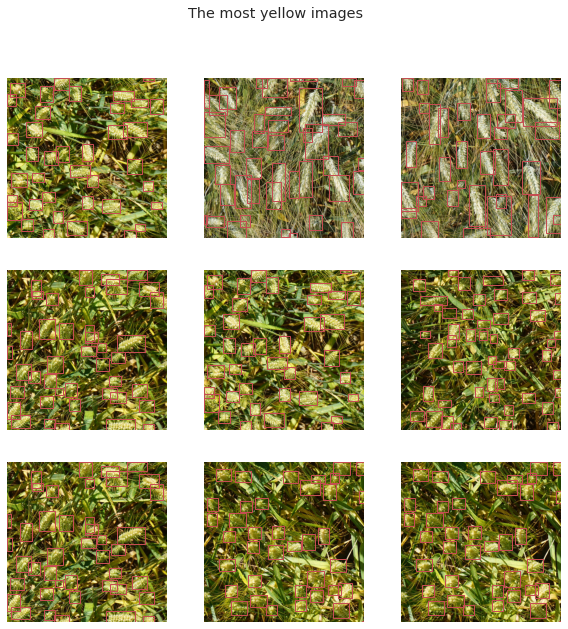

In [58]:
yellow_ids = all_train_images[all_train_images['yellow_pixels'] > 0.55].image_id
plot_image_examples(all_train_images[all_train_images.image_id.isin(yellow_ids)], title='The most yellow images')

### DATA AUGMENTATION

In [59]:
# setup an example augmentation pipeline
# be sure to use bbox safe functions for data augmentation
example_transforms = albu.Compose([
    albu.RandomSizedBBoxSafeCrop(512, 512, erosion_rate=0.0, interpolation=1, p=1.0),
    albu.HorizontalFlip(p=0.5),
    albu.VerticalFlip(p=0.5),
    albu.OneOf([albu.RandomContrast(),
                albu.RandomGamma(),
                albu.RandomBrightness()], p=1.0),
    albu.CLAHE(p=1.0)], p=1.0, bbox_params=albu.BboxParams(format='coco', label_fields=['category_id']))

In [60]:
def apply_transforms(transforms, df, n_transforms=3):
    idx = np.random.randint(len(df), size=1)[0]
    
    image_id = df.iloc[idx].image_id
    bboxes = []
    for _, row in df[df.image_id == image_id].iterrows():
        bboxes.append([row.bbox_xmin, row.bbox_ymin, row.bbox_width, row.bbox_height])
        
    image = Image.open(train_folder + image_id + '.jpg')
    
    fig, axs = plt.subplots(1, n_transforms+1, figsize=(15,7))
    
    # plot the original image
    axs[0].imshow(image)
    axs[0].set_title('original')
    for bbox in bboxes:
        rect = patches.Rectangle((bbox[0],bbox[1]),bbox[2],bbox[3],linewidth=1,edgecolor='r',facecolor='none')
        axs[0].add_patch(rect)
    
    # apply transforms n_transforms times
    for i in range(n_transforms):
        params = {'image': np.asarray(image),
                  'bboxes': bboxes,
                  'category_id': [1 for j in range(len(bboxes))]}
        augmented_boxes = transforms(**params)
        bboxes_aug = augmented_boxes['bboxes']
        image_aug = augmented_boxes['image']

        # plot the augmented image and augmented bounding boxes
        axs[i+1].imshow(image_aug)
        axs[i+1].set_title('augmented_' + str(i+1))
        for bbox in bboxes_aug:
            rect = patches.Rectangle((bbox[0],bbox[1]),bbox[2],bbox[3],linewidth=1,edgecolor='r',facecolor='none')
            axs[i+1].add_patch(rect)
    plt.show()

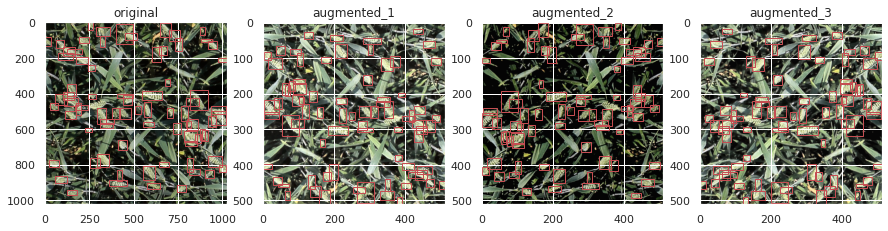

In [61]:
apply_transforms(example_transforms, all_train_images, n_transforms=3)

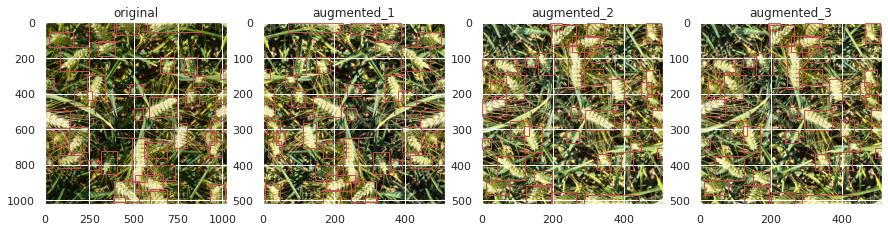

In [62]:
apply_transforms(example_transforms, all_train_images, n_transforms=3)

#### CLAHE emphasizes the features in darker spots.